In [1]:
!pip install ultralytics
!pip install -q kaggle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 715.0/715.0 kB 16.1 MB/s eta 0:00:00


In [2]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
from google.colab import files

files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"karimnady","key":"289c6cb50b6799982dfec8a3c671dc68"}'}

In [3]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [4]:
!kaggle datasets download -d barzansaeedpour/traffic-sign-detection

100% 476M/477M [00:28<00:00, 12.0MB/s]
100% 477M/477M [00:28<00:00, 17.5MB/s]


In [5]:
!unzip -o $(ls -hat | grep -m 1 ".zip")

Archive:  traffic-sign-detection.zip
  inflating: classes.txt             
  inflating: data_custom.yaml        
  inflating: data_custom_kaggle.yaml  
  inflating: notes.json              
  inflating: train/images/006fbb25-frame-2-20305.jpg  
  inflating: train/images/011f164d-frame20965.jpg  
  inflating: train/images/01b5557f-frame-2-6320.jpg  
  inflating: train/images/0209a641-frame1290.jpg  
  inflating: train/images/0254a7a0-frame-2-20005.jpg  
  inflating: train/images/02b6bd26-0024.250.jpg  
  inflating: train/images/02be71bc-frame8765.jpg  
  inflating: train/images/031edeb6-0046.840.jpg  
  inflating: train/images/0323c88d-0000.820.jpg  
  inflating: train/images/039e330f-frame5325.jpg  
  inflating: train/images/04ab1189-frame1310.jpg  
  inflating: train/images/04b74b89-frame18350.jpg  
  inflating: train/images/04c52984-frame-2-18970.jpg  
  inflating: train/images/05a96aee-frame-2-17380.jpg  
  inflating: train/images/05c07104-frame20345.jpg  
  inflating: train/images/

In [7]:
!yolo task=detect mode=train model=yolov8m.pt data=/content/data_custom_mod.yaml epochs=40 imgsz=300 batch=64

Ultralytics YOLOv8.1.14 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/data_custom_mod.yaml, epochs=40, time=None, patience=50, batch=64, imgsz=300, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, sh

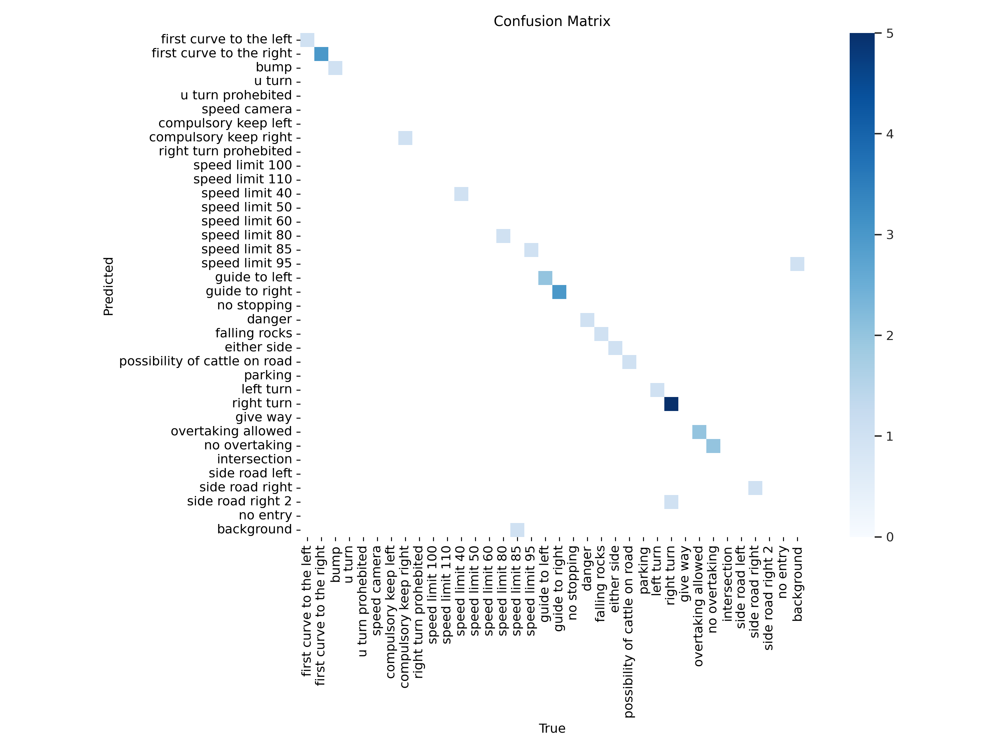

In [9]:
Image(filename=f'/content/runs/detect/train2/confusion_matrix.png', width= 600)

In [14]:
!yolo task=detect mode=val model=/content/runs/detect/train2/weights/best.pt data=/content/data_custom_mod.yaml

Ultralytics YOLOv8.1.14 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25860025 parameters, 0 gradients, 78.8 GFLOPs
val: Scanning /content/val/labels.cache... 25 images, 0 backgrounds, 0 corrupt: 100% 25/25 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 2/2 [00:02<00:00,  1.33s/it]
                   all         25         31      0.748      0.931      0.954      0.791
first curve to the left         25          1      0.697          1      0.995      0.895
first curve to the right         25          3      0.851          1      0.995      0.909
                  bump         25          1      0.703          1      0.995      0.895
 compulsory keep right         25          1      0.679          1      0.995      0.895
        speed limit 40         25          1      0.707          1      0.995      0.895
        speed limit 80         25          1      0.935        

In [15]:
!yolo task=detect mode=predict model=/content/runs/detect/train2/weights/best.pt save=True conf=0.2 source=val/images/

Ultralytics YOLOv8.1.14 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25860025 parameters, 0 gradients, 78.8 GFLOPs

image 1/25 /content/val/images/f175612f-0000.300.jpg: 256x320 1 guide to left, 71.4ms
image 2/25 /content/val/images/f2201881-frame245.jpg: 192x320 1 speed limit 95, 70.5ms
image 3/25 /content/val/images/f2317e47-0006.130.jpg: 256x320 1 side road right, 14.5ms
image 4/25 /content/val/images/f42128dd-0053.760.jpg: 256x320 1 right turn, 13.8ms
image 5/25 /content/val/images/f49822da-frame8750.jpg: 192x320 1 bump, 14.0ms
image 6/25 /content/val/images/f5046e60-frame-2-15930.jpg: 192x320 1 right turn, 1 no overtaking, 13.0ms
image 7/25 /content/val/images/f5473d79-frame20370.jpg: 192x320 1 first curve to the left, 13.0ms
image 8/25 /content/val/images/f6183f32-frame-2-7005.jpg: 192x320 1 speed limit 40, 1 danger, 13.0ms
image 9/25 /content/val/images/f6976d1e-frame-2-12765.jpg: 192x320 1 possibility of cattle on road, 13.0m

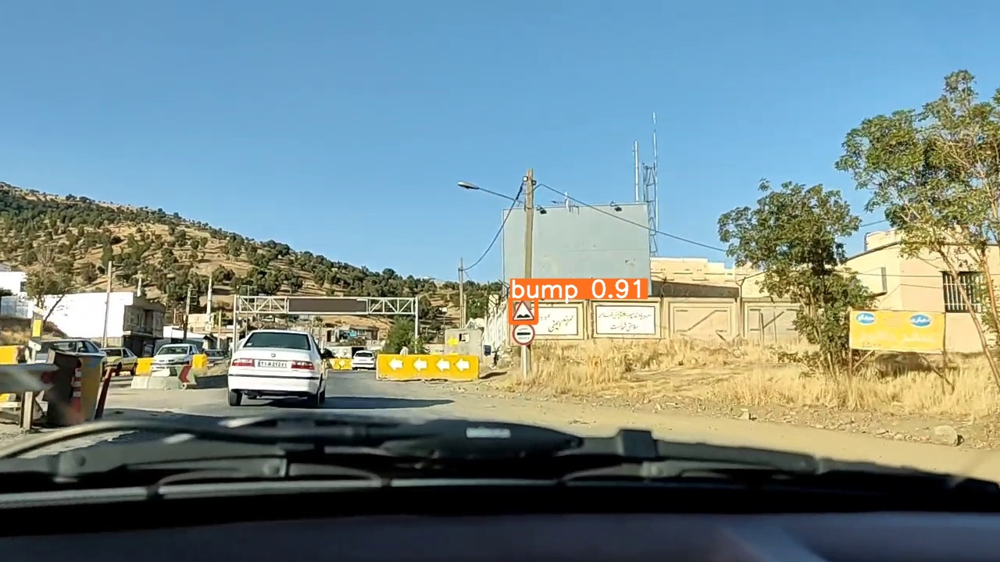

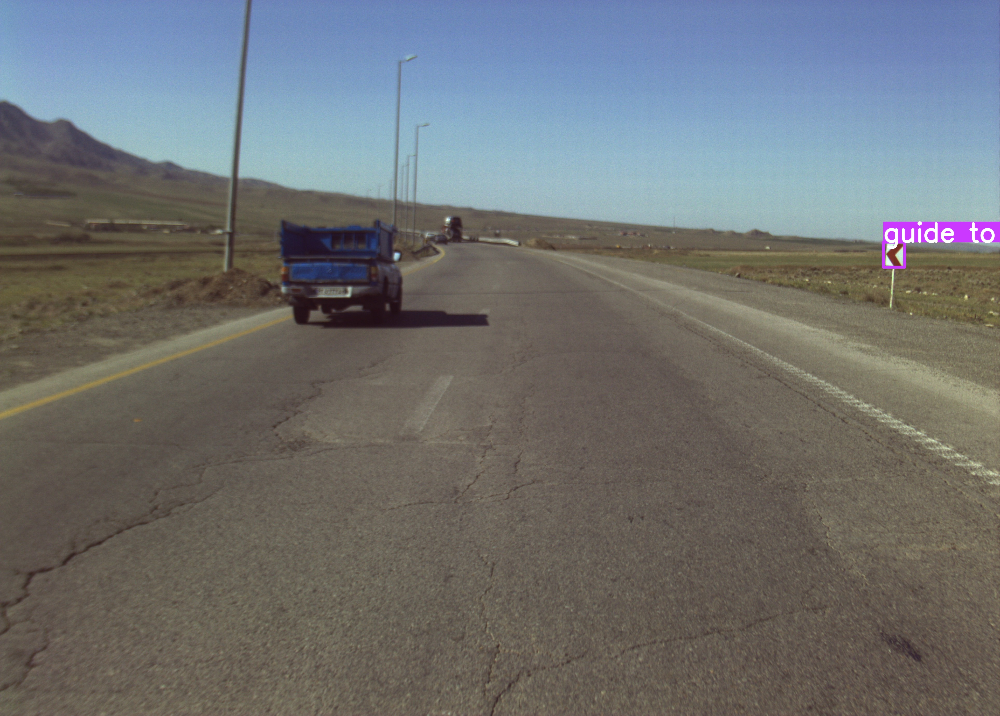

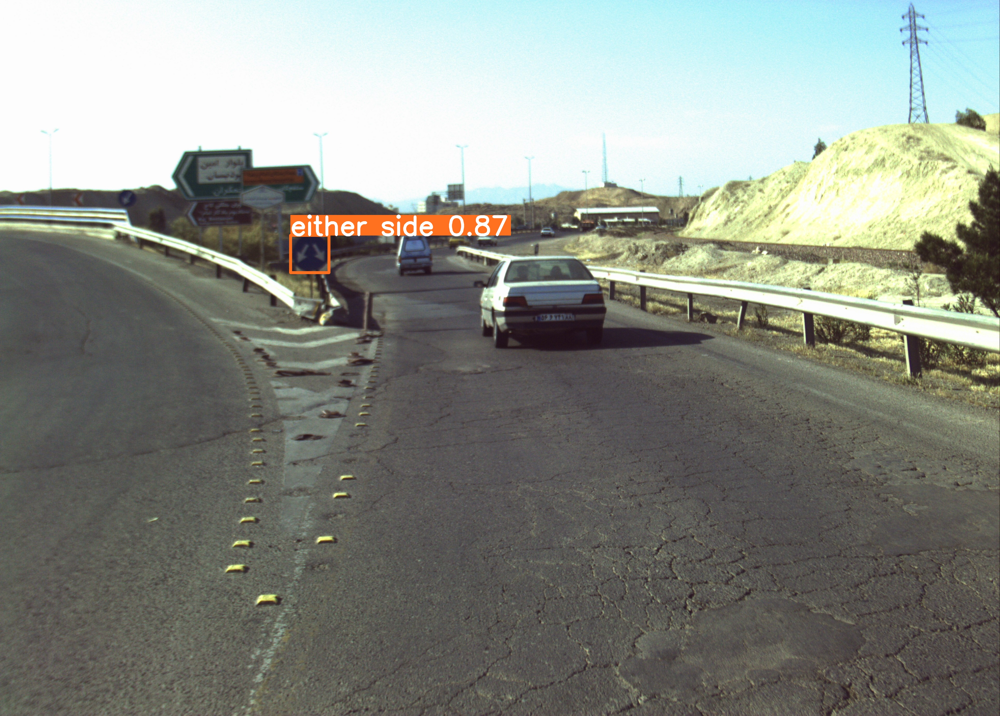

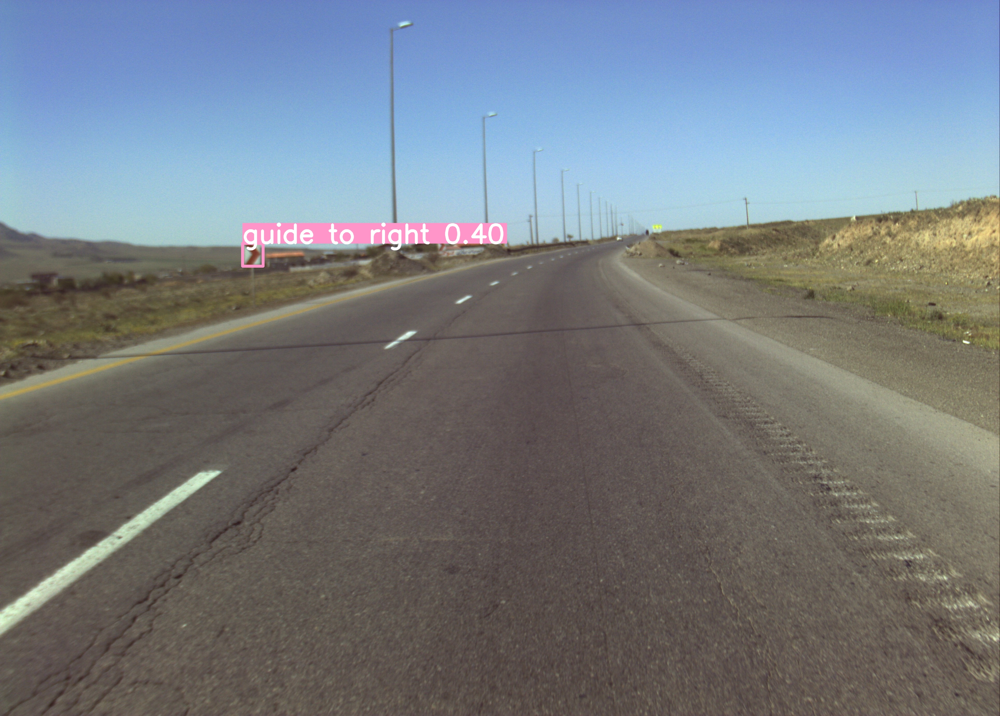

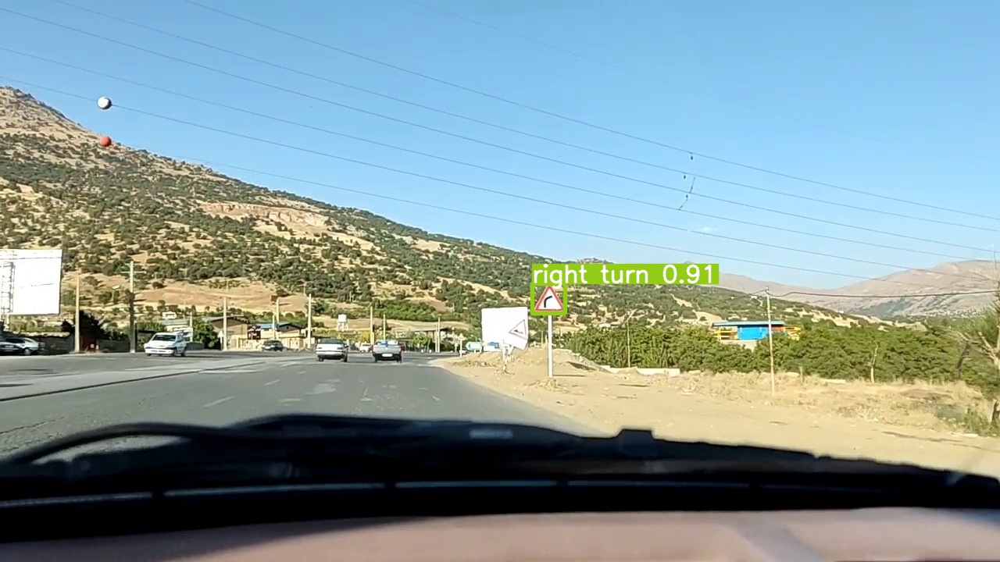

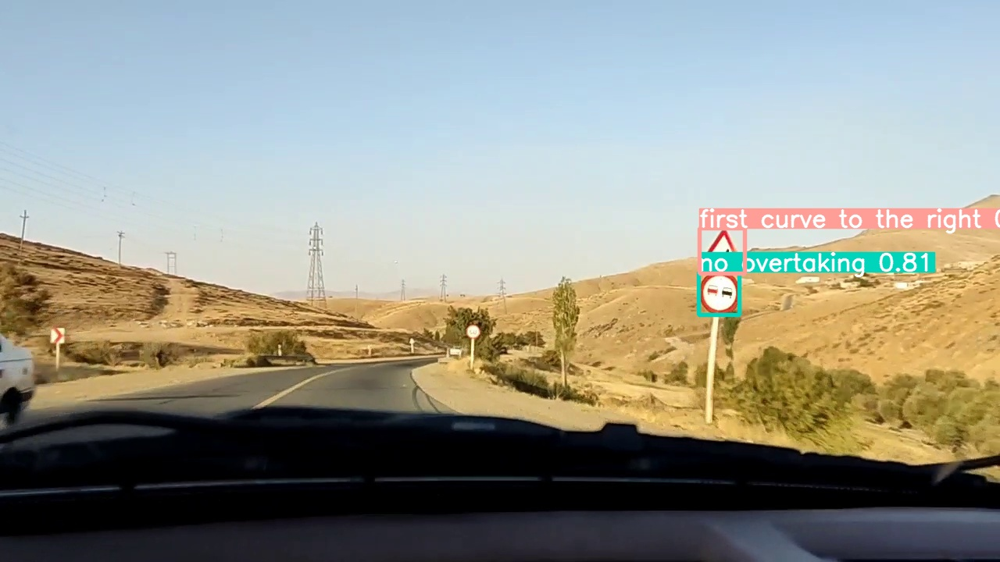

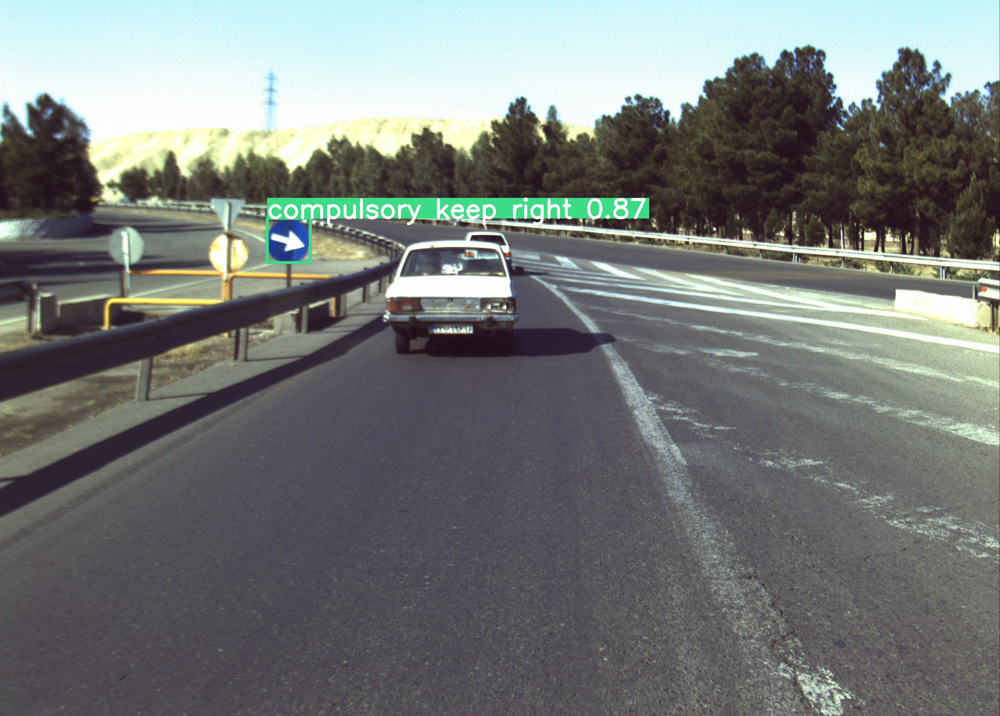

In [16]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
    display(Image(filename=image_path, height=300))
    print('\n')

In [17]:
import shutil
shutil.make_archive('runs', 'zip', 'runs_yolov8')